In [1]:
# %matplotlib inline
%config InlineBackend.figure_format = "retina"
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')

import seaborn as sns

# feel free to modify, for example, change the context to "notebook"
sns.set_theme(context="talk", style="whitegrid", 
              palette="colorblind", color_codes=True, 
              rc={"figure.figsize": [12, 8]})

import yfinance as yf
import numpy as np
import pandas as pd
import quantstats as qs
# qs.extend_pandas() ## Add the methods of `quantstats` to the `pandas` DataFrame:

In [2]:
ASSETS = [  'ODPV3' , 'TASA4' , 'KEPL3' , # quality factor
            'EMBR3' , 'POMO4' , 'JSLG3' , # momnetum 
            'GOAU4' , 'PETR4' , 'LIGT3' , # value
            'EVEN3' , 'SLCE3' , 'MDIA3' ]  # growth

ASSETS.sort()
n_assets = len(ASSETS)
rf = .10
n_days=252
n_monte_carlo = 10**5

In [3]:
benchm = yf.download('^BVSP', period='2y' , auto_adjust=True)['Close']
benchm.index = benchm.index.date                    # ajeita o indice da tabela
benchm = benchm.rename('Ibov') 
prices = yf.download([x+'.SA' for x in ASSETS], period='2y' , auto_adjust=True)['Close']
prices.columns = prices.columns.str.rstrip('.SA')   # retira '.SA' dos nomes das colunas

prices.head(3)


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  12 of 12 completed


Ticker,EMBR3,EVEN3,GOAU4,JSLG3,KEPL3,LIGT3,MDIA3,ODPV3,PETR4,POMO4,SLCE3,TASA4
Date,,,,,,,,,,,,
2022-08-09,13.68,5.472154,8.339703,5.544855,8.640339,5.94,31.710831,9.029892,19.870211,2.159487,17.280720,17.268478
2022-08-10,14.19,5.808086,8.434922,6.029448,8.927104,6.08,31.964678,8.956180,19.806166,2.254504,17.802414,16.811924
2022-08-11,14.30,5.427952,8.506337,5.954895,8.968664,5.79,31.027407,8.707397,19.347170,2.211314,17.814547,16.874590


In [4]:
returns = prices.pct_change().dropna()

avg_ret_aa = returns.mean() * n_days
cov_mat_aa = returns.cov() * n_days

correl = returns.corr()

correlações

In [5]:
from scipy.cluster.hierarchy import dendrogram, linkage, distance


correl = returns.corr()
# Calcular a distância entre as variáveis
dist = distance.pdist(correl.values)
# Calcular o linkage
link_mat = linkage(correl.values, method='average')

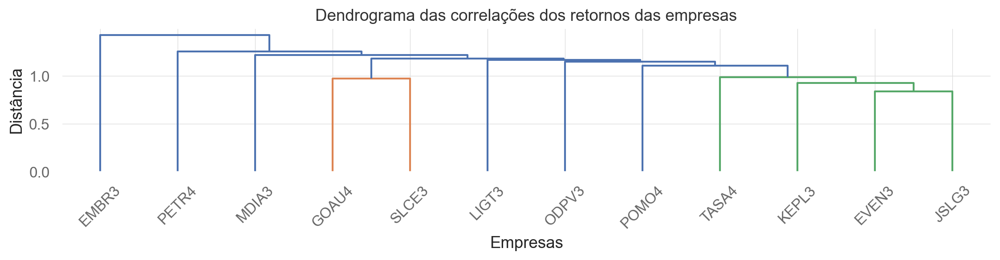

In [6]:

# Criar um dendrograma
plt.figure(figsize=(len(ASSETS), 2))
dendrograma = dendrogram(link_mat,labels=correl.columns)
plt.title('Dendrograma das correlações dos retornos das empresas')
plt.ylabel('Distância')
plt.xlabel('Empresas')
plt.xticks(rotation=45)
plt.show()

<Figure size 500x500 with 0 Axes>

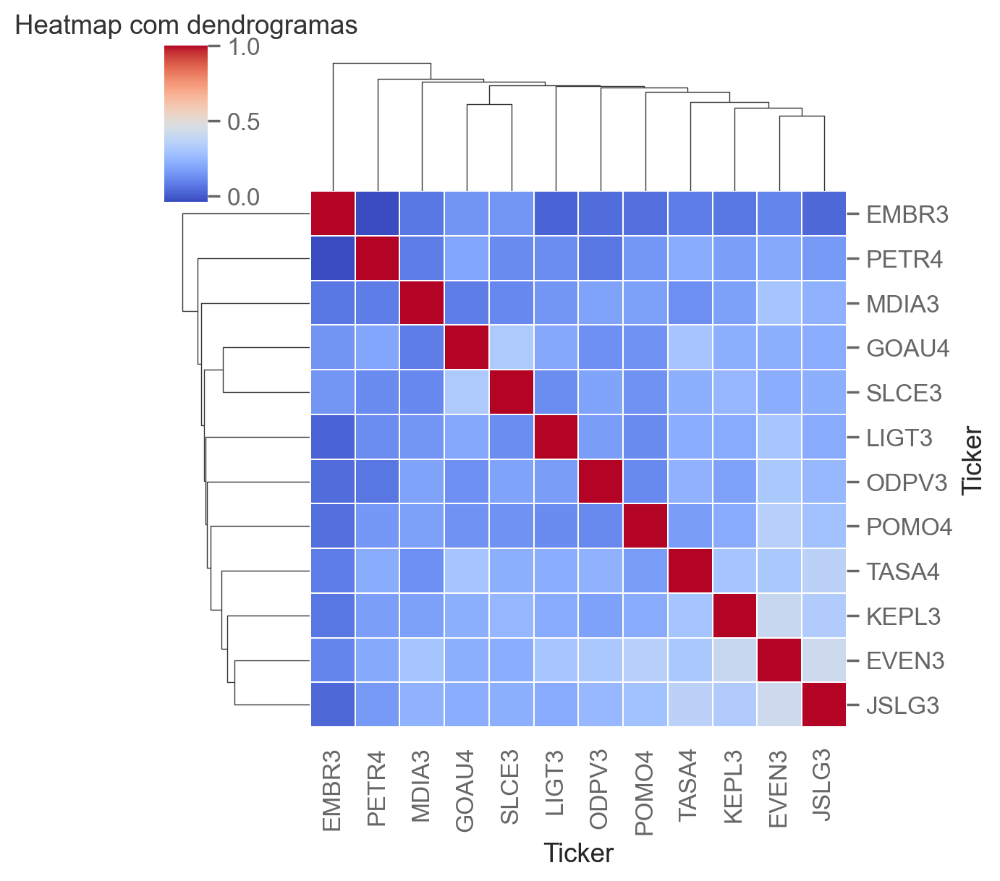

In [7]:
# Plotar o heatmap com dendrogramas
plt.figure(figsize=(5,5))
sns.clustermap(correl, method='average', metric='euclidean', cmap='coolwarm', linewidths=0.1,
               figsize=(6,6), row_cluster=True, col_cluster=True)
plt.title('Heatmap com dendrogramas')
plt.show()

simulação Monte Carlo

In [8]:
def print_summary(perf, weights, assets, name):
    """
    Helper function for printing the performance summary of a portfolio.
    
    Args:
        perf (pd.Series): Series containing the performance metrics
        weights (np.array): array containing the portfolio weights
        assets (list): list of the asset names
        name (str): the name of the portfolio

    Returns:
        df : python dataframe asset : weight
    """
    print(f" --- Carteira {name} ----")
    print("\nPerformance")
    for index, value in perf.items():
        print(f"{index}: {100 * value:.2f}% ", end="", flush=True)
    print("\nPesos dos ativos")
    for x, y in zip(assets, weights):
        print(f"{x}: {100*y:.2f}% ", end="", flush=True)
        
    return pd.DataFrame.from_dict({x: y for x, y in zip(ASSETS, weights)}, orient='index', columns=['Valores'])



In [9]:
def random_protfolios (aa_ret , aa_cov , n_port = n_monte_carlo , rf=rf) :
    """
    Gera um data frame com as métricas de performance de carteiras, 
    sobre uma lista de assets, com pesos sorterados 

    Args:
        n_port : quantidade de carteiras geradas
        aa_ret : list of annualized returns
        aa_cov : matrix annualized covariances  

    Returns:
        matriz dos pesos
        Dataframe com métricas de performance das carteiras
  """

    n_assets = len(avg_ret_aa)

    #  pesos dos ativos, cada peso weights[i] uma carteira
    np.random.seed(42)
    weights = np.random.random(size=(n_port, n_assets))     # sorteia pesos
    weights /=  np.sum(weights, axis=1)[:, np.newaxis]      # normaliza os pesos

    #  retorno das carteiras
    portf_rtns = np.dot(weights, aa_ret)
    #  vol das carterias 
    portf_vol = []
    for i in range(0, len(weights)):
        vol = np.sqrt(np.dot(weights[i].T, np.dot(aa_cov, weights[i])))
        portf_vol.append(vol)
    portf_vol = np.array(portf_vol)  
    #  sharpe das carterias 
    portf_sharpe_ratio = (portf_rtns - rf)/ portf_vol

    MC_portf_results_df = pd.DataFrame(
        {"retorno": portf_rtns,
         "volatilidade": portf_vol,
         "sharpe_ratio": portf_sharpe_ratio}
    )
    # print(f'resultado das {n_port} carteiras geradas' )

    return weights, pd.DataFrame({"retorno": portf_rtns, "volatilidade": portf_vol,"sharpe_ratio": portf_sharpe_ratio})

In [10]:
pesos, MC_portf_results = random_protfolios(avg_ret_aa , cov_mat_aa)
MC_portf_results

,retorno,volatilidade,sharpe_ratio
0,0.242110,0.209740,0.677553
1,0.255873,0.195467,0.797441
2,0.234175,0.203975,0.657799
3,0.243372,0.199764,0.717708
4,0.207638,0.214523,0.501756
...,...,...,...
99995,0.221276,0.213514,0.567999
99996,0.248795,0.193226,0.770055
99997,0.264971,0.200986,0.820805
99998,0.257666,0.188112,0.838149


carteira com maior sharpe

 --- Carteira maior sharpe ----

Performance
retorno: 41.37% volatilidade: 19.63% sharpe_ratio: 159.83% 
Pesos dos ativos
EMBR3: 20.20% EVEN3: 1.72% GOAU4: 4.50% JSLG3: 11.78% KEPL3: 14.51% LIGT3: 2.52% MDIA3: 0.71% ODPV3: 6.27% PETR4: 15.51% POMO4: 19.98% SLCE3: 0.11% TASA4: 2.20% 

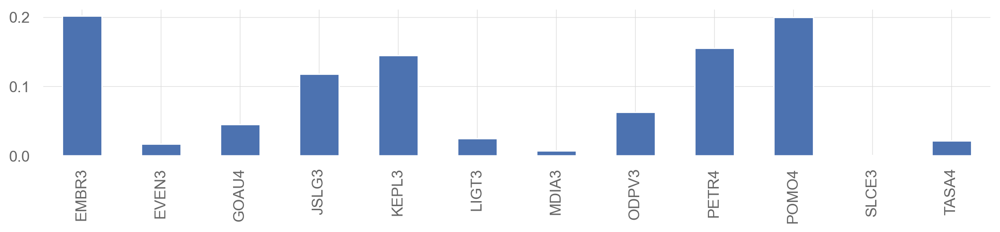

In [11]:
MC_max_sharpe_index = np.argmax(MC_portf_results["sharpe_ratio"])    # indice da carteira max sharpe
MC_max_sharpe_portf = MC_portf_results.loc[MC_max_sharpe_index]      # metricas da certeira de max sharpe

MC_Max_Sharpe = print_summary(MC_max_sharpe_portf, pesos[MC_max_sharpe_index] , ASSETS, 'maior sharpe')
MC_Max_Sharpe.plot.bar(figsize=(n_assets,2), legend=False);


carteira maior retorno

 --- Carteira maior retorno ----

Performance
retorno: 43.36% volatilidade: 22.58% sharpe_ratio: 147.72% 
Pesos dos ativos
EMBR3: 14.35% EVEN3: 0.69% GOAU4: 0.03% JSLG3: 26.58% KEPL3: 0.44% LIGT3: 2.64% MDIA3: 0.11% ODPV3: 5.20% PETR4: 18.25% POMO4: 25.77% SLCE3: 1.37% TASA4: 4.57% 

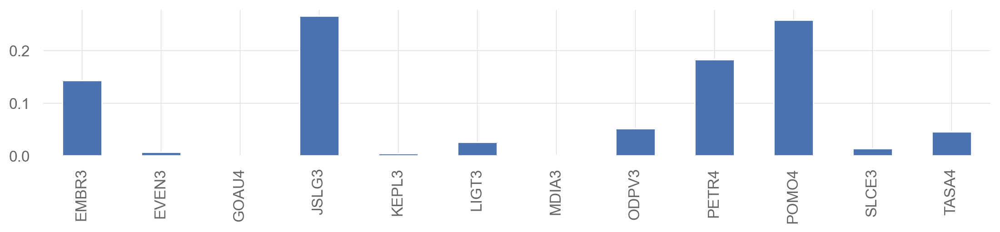

In [12]:
MC_max_ret_index = np.argmax(MC_portf_results["retorno"])    
MC_max_ret_portf = MC_portf_results.loc[MC_max_ret_index] 

MC_Max_Ret = print_summary(MC_max_ret_portf, pesos[MC_max_ret_index] , ASSETS, 'maior retorno')
MC_Max_Ret.plot.bar(figsize=(n_assets,2), legend=False);


carteira com menor vol

 --- Carteira menor vol ----

Performance
retorno: 24.26% volatilidade: 16.65% sharpe_ratio: 85.65% 
Pesos dos ativos
EMBR3: 10.80% EVEN3: 1.08% GOAU4: 11.19% JSLG3: 0.87% KEPL3: 8.47% LIGT3: 1.07% MDIA3: 11.76% ODPV3: 10.24% PETR4: 14.53% POMO4: 7.96% SLCE3: 16.08% TASA4: 5.95% 

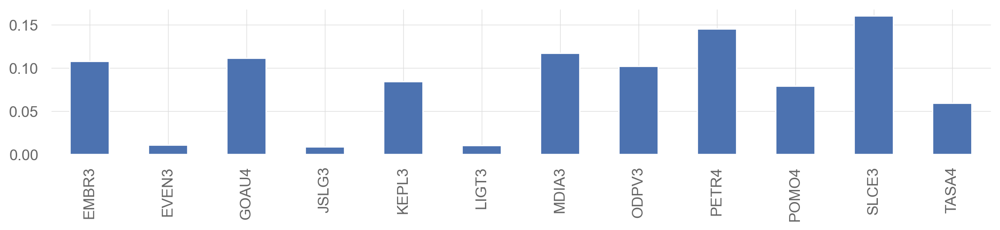

In [13]:
MC_min_vol_index = np.argmin(MC_portf_results["volatilidade"]) # indice da carteira min vol
MC_min_vol_portf = MC_portf_results.loc[MC_min_vol_index]       # metricas da certeira de min vol

MC_Min_Vol = print_summary(MC_min_vol_portf, pesos[MC_min_vol_index] , ASSETS, 'menor vol')
MC_Min_Vol.plot.bar(figsize=(n_assets,2), legend=False);

In [14]:
if n_monte_carlo <= 10**5 :
    import plotly.graph_objects as go

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=MC_portf_results["volatilidade"],y=MC_portf_results["retorno"],
                            mode="markers",marker=dict(color=MC_portf_results["sharpe_ratio"],
                                                        colorscale="Viridis",
                                                        colorbar=dict(title="Sharpe Ratio"),
                                                        ), showlegend=False))
    # ponto de Sharpe Ratio máximo
    fig.add_trace(go.Scatter(x=[MC_max_sharpe_portf.volatilidade],y=[MC_max_sharpe_portf.retorno],
                            mode="markers",marker=dict(color="black", symbol="star", size=12,),
                            name="Max Sharpe Ratio",))

    # ponto de volatilidade mínima
    fig.add_trace(go.Scatter(x=[MC_min_vol_portf.volatilidade],y=[MC_min_vol_portf.retorno],
                            mode="markers",marker=dict(color="black", symbol="diamond", size=12,),
                            name="Min Vol",))

    fig.update_layout(xaxis_title="Risco",yaxis_title="Retorno",
        title="Retorno vs. Risco com Sharpe Ratio como Mapa de Calor",
        legend=dict(
            x=1,  # Posição horizontal (0 = esquerda, 1 = direita)
            y=1,  # Posição vertical (0 = inferior, 1 = superior)
            xanchor="right",  # Ancora horizontal da legenda
            yanchor="top"   # Ancora vertical da legenda
        ))
    # Exiba o gráfico
    fig.show()

else : 
    MARKERS = ["o"]*len(ASSETS)

    with sns.plotting_context("paper"):
        fig, ax = plt.subplots()
        MC_portf_results.plot(kind="scatter", x="volatilidade", 
                            y="retorno", c="sharpe_ratio",
                            cmap="RdYlGn", edgecolors="black", 
                            ax=ax)
        ax.set(xlabel="Volatilidade", 
            ylabel="Retorno", 
            title="Fronteira eficiente via simulação")
        # ax.plot(ef_vol_list, ef_rtn_list, "b--")
        for asset_index in range(n_assets):
            ax.scatter(x=np.sqrt(cov_mat_aa.iloc[asset_index, asset_index]), 
                    y=avg_ret_aa[asset_index], 
                    marker=MARKERS[asset_index], 
                    s=150, color="black",
                    # label=ASSETS[asset_index]
                    )
            ax.text(x=np.sqrt(cov_mat_aa.iloc[asset_index, asset_index])+.005,
                y=avg_ret_aa[asset_index]+.01,
                s=ASSETS[asset_index],
                fontsize=10, ha='center', va='bottom') 
            

        # Ponto de Sharpe Ratio máximo
        ax.scatter(MC_max_sharpe_portf.volatilidade, MC_max_sharpe_portf.retorno,
                marker="*", s=100, color="black", label="Max Sharpe Ratio")

        # Ponto de volatilidade mínima
        ax.scatter(MC_min_vol_portf.volatilidade, MC_min_vol_portf.retorno,
                marker="D", s=100, color="black", label="Min Vol")

        ax.legend()

        sns.despine()
        plt.tight_layout()
        # plt.savefig("images/figure_11_10", dpi=200)

In [15]:
portfolio_returns = pd.Series(
    np.dot(pesos[MC_max_sharpe_index], returns.T ), 
    index=returns.index
)


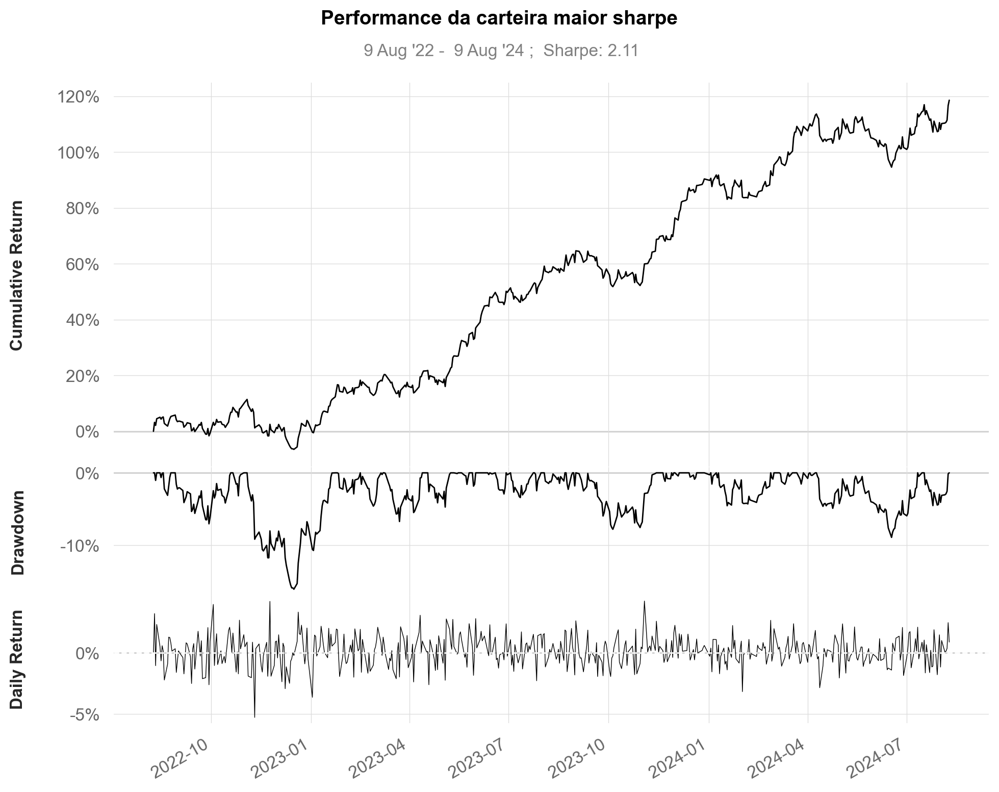

In [16]:
qs.plots.snapshot(portfolio_returns, title="Performance da carteira maior sharpe", grayscale=True)

In [17]:
qs.reports.metrics(portfolio_returns, benchmark="^BVSP", mode="basic" , rf=rf)

[*********************100%%**********************]  1 of 1 completed


                    Benchmark (^BVSP)    Strategy
------------------  -------------------  ----------
Start Period        2022-08-10           2022-08-10
End Period          2024-08-09           2024-08-09
Risk-Free Rate      10.0%                10.0%
Time in Market      100.0%               100.0%

Cumulative Return   18.49%               111.82%
CAGR﹪              6.03%                29.58%

Sharpe              0.03                 1.55
Prob. Sharpe Ratio  7.61%                73.55%
Sortino             0.05                 2.34
Sortino/√2          0.03                 1.65
Omega               1.29                 1.29

Max Drawdown        -18.35%              -16.07%
Longest DD Days     240                  92

Gain/Pain Ratio     0.1                  0.39
Gain/Pain (1M)      0.59                 3.57

Payoff Ratio        1.01                 1.15
Profit Factor       1.1                  1.39
Common Sense Ratio  1.15                 1.54
CPC Index           0.55                 0.

In [18]:
[method for method in dir(qs.stats) if method[0] != "_"]

['adjusted_sortino',
 'autocorr_penalty',
 'avg_loss',
 'avg_return',
 'avg_win',
 'best',
 'cagr',
 'calmar',
 'common_sense_ratio',
 'comp',
 'compare',
 'compsum',
 'conditional_value_at_risk',
 'consecutive_losses',
 'consecutive_wins',
 'cpc_index',
 'cvar',
 'distribution',
 'drawdown_details',
 'expected_return',
 'expected_shortfall',
 'exposure',
 'gain_to_pain_ratio',
 'geometric_mean',
 'ghpr',
 'greeks',
 'implied_volatility',
 'information_ratio',
 'kelly_criterion',
 'kurtosis',
 'max_drawdown',
 'monthly_returns',
 'omega',
 'outlier_loss_ratio',
 'outlier_win_ratio',
 'outliers',
 'payoff_ratio',
 'pct_rank',
 'probabilistic_adjusted_sortino_ratio',
 'probabilistic_ratio',
 'probabilistic_sharpe_ratio',
 'probabilistic_sortino_ratio',
 'profit_factor',
 'profit_ratio',
 'r2',
 'r_squared',
 'rar',
 'recovery_factor',
 'remove_outliers',
 'risk_of_ruin',
 'risk_return_ratio',
 'rolling_greeks',
 'rolling_sharpe',
 'rolling_sortino',
 'rolling_volatility',
 'ror',
 'seren